<a href="https://colab.research.google.com/github/jadhav-kunal/Text-Classification-Using-BERT/blob/main/Text_BERT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [1]:
! python --version

Python 3.7.12


In [2]:
!pip install tensorflow_hub
!pip install keras tf-models-official pydot graphviz

     |████████████████████████████████| 1.8 MB 6.6 MB/s 
     |████████████████████████████████| 352 kB 45.0 MB/s 
     |████████████████████████████████| 47.7 MB 100 kB/s 
     |████████████████████████████████| 213 kB 36.4 MB/s 
     |████████████████████████████████| 99 kB 6.3 MB/s 
     |████████████████████████████████| 4.9 MB 30.2 MB/s 
     |████████████████████████████████| 90 kB 4.9 MB/s 
     |████████████████████████████████| 1.2 MB 38.5 MB/s 
     |████████████████████████████████| 596 kB 28.5 MB/s 
     |████████████████████████████████| 43 kB 1.4 MB/s 
     |████████████████████████████████| 1.1 MB 28.3 MB/s 
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22258 sha256=e29343ac6e9121a0a9d7ad395751cfc050670a66b50a6e2789635a882e9db058
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/041add21dc9c4220157f1bd2bd6afe1f1a49524c3396b94401
  Created wheel for seqeval: filename=seqeval-1.2.2-py3-none-any.whl size=16181 sha256=92a9b30851eb75ec8

In [3]:
import os

import numpy as np
import pandas as pd

import tensorflow as tf
import tensorflow_hub as hub

from keras.utils import np_utils

import official.nlp.bert.bert_models
import official.nlp.bert.configs
import official.nlp.bert.run_classifier
import official.nlp.bert.tokenization as tokenization

from official.modeling import tf_utils
from official import nlp
from official.nlp import bert

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

import matplotlib.pyplot as plt

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

print("Version: ", tf.__version__)
print("Eager mode: ", tf.executing_eagerly())
print("Hub version: ", hub.__version__)
print("GPU is", "available" if tf.config.list_physical_devices('GPU') else "NOT AVAILABLE")

1 Physical GPUs, 1 Logical GPUs
Version:  2.7.0
Eager mode:  True
Hub version:  0.12.0
GPU is available


# Data

For this example you need to download twitter data from Kaggle: https://www.kaggle.com/kazanova/sentiment140

Context \\
\
This is the sentiment140 dataset. It contains 1,600,000 tweets extracted using the twitter api . The tweets have been annotated (0 = negative, 4 = positive) and they can be used to detect sentiment. \\
\
Content \\
\
It contains the following 6 fields:
* target: the polarity of the tweet (0 = negative, 4 = positive)

* ids: The id of the tweet ( 2087)

* date: the date of the tweet (Sat May 16 23:58:44 UTC 2009)

* flag: The query (lyx). If there is no query, then this value is NO_QUERY.

* user: the user that tweeted (robotickilldozr)

* text: the text of the tweet (Lyx is cool)


In [4]:
pip install opendatasets --upgrade --quiet

In [5]:
import opendatasets as od
download_url='https://www.kaggle.com/kazanova/sentiment140'
od.download(download_url)
#{"username":"jadhavkunal","key":"4dc127f71a8b6713d0e62513c669150e"}

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: jadhavkunal
Your Kaggle Key: ··········


100%|██████████| 80.9M/80.9M [00:02<00:00, 39.0MB/s]


In [6]:
df = pd.read_csv('/content/sentiment140/training.1600000.processed.noemoticon.csv',
                 encoding='ISO-8859-1', 
                 names=[
                        'target',
                        'id',
                        'date',
                        'flag',
                        'user',
                        'text'
                        ])

In [7]:
df.head()

,target,id,date,flag,user,text
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."


We have two classes in the dataset

In [8]:
df.target.unique()

array([0, 4])

Let's check how equally distributed those classes are.

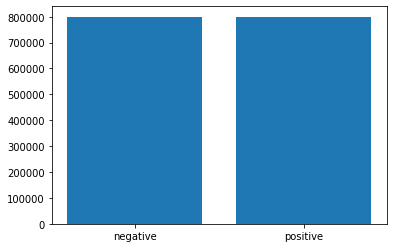

In [9]:
classes = df.target.unique()
counts = []

for i in classes:
  count = len(df[df.target==i])
  counts.append(count)

plt.bar(['negative', 'positive'], counts)
plt.show()

Even class distribution helps us a lot in text classifiction. Imagine a situation where 95% of data is in one class and the rest 5% is split among other 5 classes. If we wouldn't do anything about it model would just learn to guess the 95% class all the time and would be correct 95% of the time on the data we would use.

To start modelling we still need to do a couple of things:

1.   Split data into train and test datasets
2.   Encode labels
3.   Tokenize text



## Train/test split

We don't really need all 1.6 Million tweets for training so we can take a sample of 5% (to save up time on training) and then split that into 80% for training and 20% for testing.

In [10]:
sample_size = int(len(df)*0.05)
sampleDf = df.sample(sample_size, random_state=23)
x = sampleDf.text.values
y = sampleDf.target.values
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=32)

## Label Encoding

We could get away with other approach but you might want to use this for more than binary classification.

In [45]:
y_test

array([0, 0, 4, ..., 0, 0, 4])

In [42]:
encoder = LabelEncoder()
encoder.fit(y)
encoded_Y_test = encoder.transform(y_test)
encoded_Y_train = encoder.transform(y_train)


# convert integers to dummy variables (i.e. one hot encoded)
dummy_y_test = np_utils.to_categorical(encoded_Y_test)
dummy_y_train = np_utils.to_categorical(encoded_Y_train)

In [46]:
dummy_y_test


array([[1., 0.],
       [1., 0.],
       [0., 1.],
       ...,
       [1., 0.],
       [1., 0.],
       [0., 1.]], dtype=float32)

In [43]:
encoded_Y_test

array([0, 0, 1, ..., 0, 0, 1])

In [44]:
encoded_Y_train


array([0, 1, 1, ..., 1, 0, 1])

We might want to use encoding for later. For that we can save enconding map.

In [13]:
encoder_fname = 'twitter_classes.npy'
my_wd = '/content/'
np.save(os.path.join(my_wd, encoder_fname) , encoder.classes_)

To load it when you'll use this in production just use the below cell (uncommented ofcourse)

In [14]:
# encoder = LabelEncoder()
# encoder.classes_ = np.load(os.path.join(my_wd, encoder_fname), allow_pickle=True)

## Tokenization

In [15]:
bert_layer = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_multi_cased_L-12_H-768_A-12/2",
                            trainable=True)

In [16]:
vocab_file = bert_layer.resolved_object.vocab_file.asset_path.numpy()
do_lower_case = bert_layer.resolved_object.do_lower_case.numpy()
tokenizer = tokenization.FullTokenizer(vocab_file, do_lower_case)

You can see that in above cell we have loaded some variables using the bert_layer we have downloaded. 

1.   ```vocab_file``` reads the vocab file associated to the downloaded model.
2.   ```do_lower_case``` reads binary variable which if ```True``` means tokenizer will reformat all text to lower case rendering model to be **NOT** case sensitive. Should be ```False``` by default. You can check in a cell below.
3.   ```tokenizer``` builds tokenizer using variables 1 and 2.



In [17]:
do_lower_case

False

In [18]:
tokenizer.convert_tokens_to_ids(['[CLS]', '[SEP]'])

[101, 102]

In [19]:
def encode_names(n):
   tokens = list(tokenizer.tokenize(n))
   tokens.append('[SEP]')  # seperation token. Would bemuch more useful if you had a multiple text input.
   return tokenizer.convert_tokens_to_ids(tokens)

tweets = tf.ragged.constant([
    encode_names(n) for n in x_train])

In [20]:
print('Tokenized Tweets shape', tweets.shape.as_list())

Tokenized Tweets shape [64000, None]


In [21]:
tweets[0]

<tf.Tensor: shape=(54,), dtype=int32, numpy=
array([   146,    143,  11403,  69849,  11490,    152,  65729,    157,
        58132,  11090,  17443,  14703,  32349,  14703,  17443,    160,
       108880,  29833,  39774,  30889,  11733, 102059,  66014,    157,
        58132,  11537,  47430,    160,  12396,  14703,    136,    136,
          146,  99843,  77261,    148,  67292,  13034,    106,    106,
          106,    160,  58132,  11090,  38702,  11403, 100673,  11490,
          146,  99843,    136,    136,    136,    102], dtype=int32)>

In [22]:
x_train[0]

'I FOUND OUT THAT THEY PAY THE WHITE CHICK MORE THAN ME  WHY?? I DONT KNOW!!! WHAT SHOULD I DO???'

In [23]:
tokenizedTweet = tokenizer.tokenize(x_train[0])
for i in tokenizedTweet:
  print(i, tokenizer.convert_tokens_to_ids([i]))

I [146]
F [143]
##O [11403]
##UN [69849]
##D [11490]
O [152]
##UT [65729]
T [157]
##HA [58132]
##T [11090]
THE [17443]
##Y [14703]
PA [32349]
##Y [14703]
THE [17443]
W [160]
##HI [108880]
##TE [29833]
CH [39774]
##IC [30889]
##K [11733]
MO [102059]
##RE [66014]
T [157]
##HA [58132]
##N [11537]
ME [47430]
W [160]
##H [12396]
##Y [14703]
? [136]
? [136]
I [146]
DO [99843]
##NT [77261]
K [148]
##NO [67292]
##W [13034]
! [106]
! [106]
! [106]
W [160]
##HA [58132]
##T [11090]
SH [38702]
##O [11403]
##UL [100673]
##D [11490]
I [146]
DO [99843]
? [136]
? [136]
? [136]


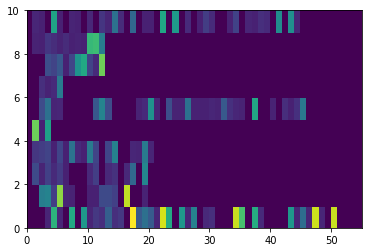

In [24]:
cls = [tokenizer.convert_tokens_to_ids(['[CLS]'])]*tweets.shape[0]
input_word_ids = tf.concat([cls, tweets], axis=-1)
_ = plt.pcolormesh(input_word_ids[0:10].to_tensor())

Graphical representation of our tokenized tweets. First token is our classification token. Other colored blocks than background are other tokens.

## Mask and input type

The model expects two additional inputs:

* The input mask
* The input type

The mask allows the model to cleanly differentiate between the content and the padding. The mask has the same shape as the `input_word_ids`, and contains a `1` anywhere the `input_word_ids` is not padding.

In [25]:
input_word_ids

<tf.RaggedTensor [[101, 146, 143, 11403, 69849, 11490, 152, 65729, 157, 58132, 11090, 17443, 14703, 32349, 14703, 17443, 160, 108880, 29833, 39774, 30889, 11733, 102059, 66014, 157, 58132, 11537, 47430, 160, 12396, 14703, 136, 136, 146, 99843, 77261, 148, 67292, 13034, 106, 106, 106, 160, 58132, 11090, 38702, 11403, 100673, 11490, 146, 99843, 136, 136, 136, 102], [101, 137, 46267, 48502, 19986, 90467, 11183, 10377, 112, 187, 10151, 10110, 24310, 24428, 20627, 117, 98370, 112, 188, 10271, 136, 102], [101, 24309, 10911, 20442, 12842, 18957, 10107, 119, 119, 119, 12489, 19838, 136, 12489, 15457, 136, 12489, 36216, 146, 49866, 136, 102], [101, 17116, 19556, 21937, 10155, 22329, 10114, 41573, 12935, 10135, 44841, 21997, 119, 22329, 47798, 112, 188, 11850, 10911, 44841, 11426, 136, 102], [101, 84532, 10105, 62431, 102], [101, 145, 25054, 39999, 10858, 11733, 106, 106, 106, 106, 106, 29639, 49307, 25054, 106, 106, 106, 106, 10529, 13028, 55233, 10911, 136, 25641, 10393, 10590, 40840, 10112, 1

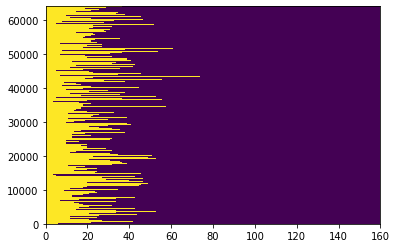

In [26]:
input_mask = tf.ones_like(input_word_ids).to_tensor()

plt.pcolormesh(input_mask)

Here each yellow block has some input. We just make this for the model to differ between padding and input.

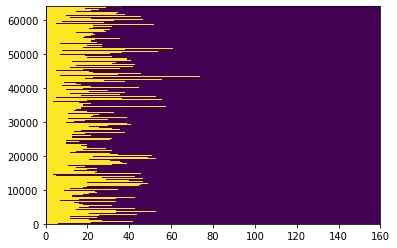

In [27]:
type_cls = tf.zeros_like(cls)
type_tweet = tf.ones_like(tweets)
input_type_ids = tf.concat([type_cls, type_tweet], axis=-1).to_tensor()

plt.pcolormesh(input_type_ids)

It's hard to see but we added an empty block in front of each tweet for the `[CLS]` token. Check tensor below

In [28]:
input_type_ids

<tf.Tensor: shape=(64000, 160), dtype=int32, numpy=
array([[0, 1, 1, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0],
       ...,
       [0, 1, 1, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0]], dtype=int32)>

## Remake into a function for normal use

So at this point we have all of our three inputs:

1.   Tokens
2.   Input mask
3.   Input type

It will make our work easier both now and in the future if we remake everything into funcitons.



In [29]:
lens = [len(i) for i in input_word_ids]

In [30]:
max_seq_length = max(lens)
print('Max length is:', max_seq_length)

Max length is: 160


In [31]:
max_seq_length = int(1.5*max_seq_length)
print('Max length is:', max_seq_length)

Max length is: 240


Functions themselves.

In [32]:
def encode_names(n, tokenizer):
   tokens = list(tokenizer.tokenize(n))
   tokens.append('[SEP]')
   return tokenizer.convert_tokens_to_ids(tokens)

def bert_encode(string_list, tokenizer, max_seq_length):
  num_examples = len(string_list)
  
  string_tokens = tf.ragged.constant([
      encode_names(n, tokenizer) for n in np.array(string_list)])

  cls = [tokenizer.convert_tokens_to_ids(['[CLS]'])]*string_tokens.shape[0]
  input_word_ids = tf.concat([cls, string_tokens], axis=-1)

  input_mask = tf.ones_like(input_word_ids).to_tensor(shape=(None, max_seq_length))

  type_cls = tf.zeros_like(cls)
  type_tokens = tf.ones_like(string_tokens)
  input_type_ids = tf.concat(
      [type_cls, type_tokens], axis=-1).to_tensor(shape=(None, max_seq_length))

  inputs = {
      'input_word_ids': input_word_ids.to_tensor(shape=(None, max_seq_length)),
      'input_mask': input_mask,
      'input_type_ids': input_type_ids}

  return inputs

And now we preprocess inputs.

In [33]:
X_train = bert_encode(x_train, tokenizer, max_seq_length)
X_test = bert_encode(x_test, tokenizer, max_seq_length)

# MODEL

## Initial training

We need to set up our model using the inputs we made, BERT model that we downloaded and an output layer based on num of classes we are using.

In [34]:
num_class = len(encoder.classes_)  # Based on available class selection
max_seq_length = max_seq_length  # we calculated this a couple cells ago

input_word_ids = tf.keras.layers.Input(shape=(max_seq_length,), dtype=tf.int32,
                                       name="input_word_ids")
input_mask = tf.keras.layers.Input(shape=(max_seq_length,), dtype=tf.int32,
                                   name="input_mask")
segment_ids = tf.keras.layers.Input(shape=(max_seq_length,), dtype=tf.int32,
                                    name="segment_ids")

pooled_output, sequence_output = bert_layer([input_word_ids, input_mask, segment_ids])                                  

output = tf.keras.layers.Dropout(rate=0.1)(pooled_output)

output = tf.keras.layers.Dense(num_class, activation='softmax', name='output')(output)

model = tf.keras.Model(
    inputs={
        'input_word_ids': input_word_ids,
        'input_mask': input_mask,
        'input_type_ids': segment_ids
        },
        outputs=output)

Our model.

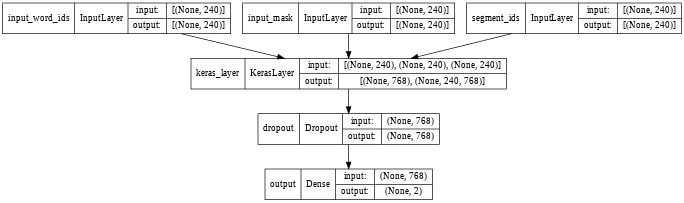

In [35]:
tf.keras.utils.plot_model(model, show_shapes=True, dpi=48)

Set up the training parameters.

In [36]:
epochs = 3
batch_size = 16  # select based on your GPU resources
eval_batch_size = batch_size

train_data_size = len(dummy_y_train)
steps_per_epoch = int(train_data_size / batch_size)
num_train_steps = steps_per_epoch * epochs
warmup_steps = int(epochs * train_data_size * 0.1 / batch_size)

optimizer = nlp.optimization.create_optimizer(
    2e-5, num_train_steps=num_train_steps, num_warmup_steps=warmup_steps)

Compile the model.

In [37]:
model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [38]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_word_ids (InputLayer)    [(None, 240)]        0           []                               
                                                                                                  
 input_mask (InputLayer)        [(None, 240)]        0           []                               
                                                                                                  
 segment_ids (InputLayer)       [(None, 240)]        0           []                               
                                                                                                  
 keras_layer (KerasLayer)       [(None, 768),        177853441   ['input_word_ids[0][0]',         
                                 (None, 240, 768)]                'input_mask[0][0]',         

Set up a history to check our model performance afterwards.

In [ ]:
history = model.fit(X_train,
                    dummy_y_train,
                    epochs=epochs,
                    batch_size=batch_size,
                    validation_data=(X_test, dummy_y_test),
                    verbose=1)

Evaluation

In [41]:
# loss, accuracy = model.evaluate(X_train, dummy_y_train)
# print("Training Accuracy: {:.4f}".format(accuracy))
loss, accuracy = model.evaluate(X_test, dummy_y_test)
print("Testing Accuracy:  {:.4f}".format(accuracy))

500/500 [==============================] - 545s 1s/step - loss: 0.4238 - accuracy: 0.8171
Testing Accuracy:  0.8171


Noice plots are noice

In [ ]:
plt.style.use('ggplot')

def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    x = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(x, acc, 'b', label='Training acc')
    plt.plot(x, val_acc, 'r', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(x, loss, 'b', label='Training loss')
    plt.plot(x, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

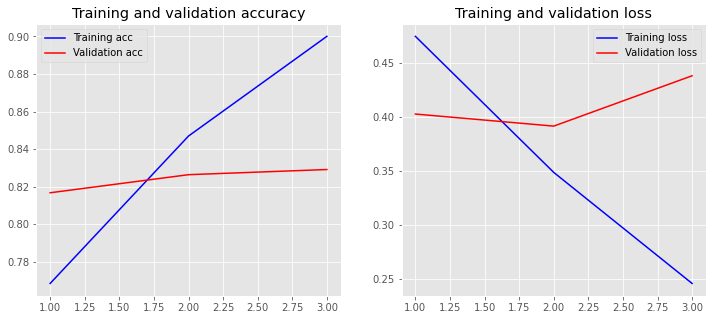

In [ ]:
plot_history(history)

So, looking at the plot above we can see that at the 3rd epoch our `Validation Loss` jumped significantly even though `Validation Accuracy` stayed pretty much the same. If we would train it more on the same data it would significantly overtrain. \\
What we can do instead is make another training dataset, lower our learning rate commonly denoted as `lr`, recompile our model using new `lr` and then train it a bit more. \\
But before doing that we should save our model just in case if we would want to do the additional training.

## Model saving for later use

Let's save our model for later use. Unfortunatelly we can't use the optimizer we used for model training to save. I get an error and I can't resolve it. So we will recompile our model before saving.

In [ ]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
model_fname = 'twitter_BERT'
my_wd = '/content/'

model.save(os.path.join(my_wd, model_fname))

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.


Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.


Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.


Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.


INFO:tensorflow:Assets written to: /content/drive/My Drive/YouTube/botters_2020-10/twitter_sentiment_course/twitter_BERT/assets


INFO:tensorflow:Assets written to: /content/drive/My Drive/YouTube/botters_2020-10/twitter_sentiment_course/twitter_BERT/assets


Sometimes TF likes to corrupt your model when saving. It's always a good idea to check if everything loads correctly after save.

In [ ]:
model_fname = 'twitter_BERT'
my_wd = '/content/'

new_model = tf.keras.models.load_model(os.path.join(my_wd, model_fname))

In [ ]:
loss, accuracy = new_model.evaluate(X_test, dummy_y_test, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))

Testing Accuracy:  0.8291


In [ ]:
new_model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_word_ids (InputLayer)     [(None, 240)]        0                                            
__________________________________________________________________________________________________
input_mask (InputLayer)         [(None, 240)]        0                                            
__________________________________________________________________________________________________
segment_ids (InputLayer)        [(None, 240)]        0                                            
__________________________________________________________________________________________________
keras_layer (KerasLayer)        [(None, 768), (None, 177853441   input_word_ids[0][0]             
                                                                 input_mask[0][0]      

In [ ]:
tokenizerSaved = bert.tokenization.FullTokenizer(
    vocab_file=os.path.join(my_wd, model_fname, 'assets/vocab.txt'),
    do_lower_case=False)

In [ ]:
tokenizedTweet = tokenizerSaved.tokenize(x_train[0])
for i in tokenizedTweet:
  print(i, tokenizerSaved.convert_tokens_to_ids([i]))

I [146]
F [143]
##O [11403]
##UN [69849]
##D [11490]
O [152]
##UT [65729]
T [157]
##HA [58132]
##T [11090]
THE [17443]
##Y [14703]
PA [32349]
##Y [14703]
THE [17443]
W [160]
##HI [108880]
##TE [29833]
CH [39774]
##IC [30889]
##K [11733]
MO [102059]
##RE [66014]
T [157]
##HA [58132]
##N [11537]
ME [47430]
W [160]
##H [12396]
##Y [14703]
? [136]
? [136]
I [146]
DO [99843]
##NT [77261]
K [148]
##NO [67292]
##W [13034]
! [106]
! [106]
! [106]
W [160]
##HA [58132]
##T [11090]
SH [38702]
##O [11403]
##UL [100673]
##D [11490]
I [146]
DO [99843]
? [136]
? [136]
? [136]


## Second training itteration

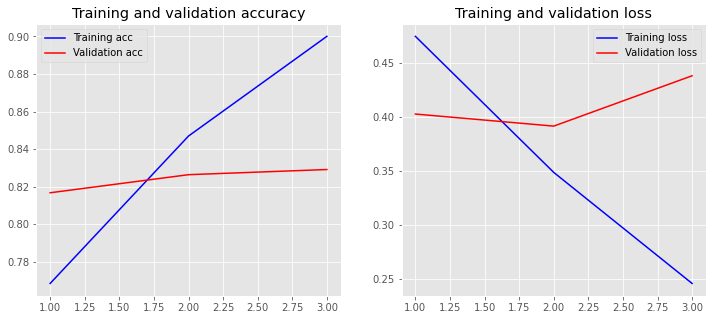

In [ ]:
plot_history(history)

### Data

In [ ]:
sample_size = int(len(df)*0.05)
sampleDf = df.sample(sample_size, random_state=42)  # notice the random state changes
x = sampleDf.text.values
y = sampleDf.target.values
x_train2, x_test2, y_train2, y_test2 = train_test_split(x, y, test_size=0.20, random_state=42)  # notice the random state changes

[0 4]


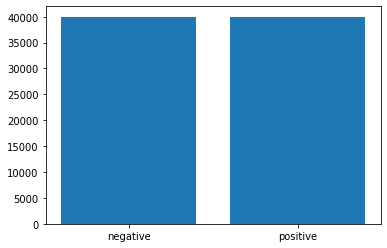

In [ ]:
classes = sampleDf.target.unique()
print(classes)
counts = []

for i in classes:
  count = len(sampleDf[sampleDf.target==i])
  counts.append(count)

plt.bar(['negative', 'positive'], counts)
plt.show()

#### Label Encoding
Now we need to encode labels again.  we have our label encoder saved.

In [ ]:
encoder_fname = 'twitter_classes.npy'
my_wd = '/content/drive/My Drive/YouTube/botters_2020-10/twitter_sentiment_course/'

encoder = LabelEncoder()
encoder.classes_ = np.load(os.path.join(my_wd, encoder_fname), allow_pickle=True)

encoded_Y_test2 = encoder.transform(y_test2)
encoded_Y_train2 = encoder.transform(y_train2)

# convert integers to dummy variables (i.e. one hot encoded)
dummy_y_test2 = np_utils.to_categorical(encoded_Y_test2)
dummy_y_train2 = np_utils.to_categorical(encoded_Y_train2)

#### Input preprocessing
As we did before we need to tokenize our inputs (tweets) as `input_word_ids` and then add `input_mask` and `input_type`. As we saved our model, we can use it to build our tokenizer as it was.

In [ ]:
model_fname = 'twitter_BERT'
my_wd = '/content/drive/My Drive/YouTube/botters_2020-10/twitter_sentiment_course/'

tokenizerSaved = bert.tokenization.FullTokenizer(
    vocab_file=os.path.join(my_wd, model_fname, 'assets/vocab.txt'),
    do_lower_case=False)

In [ ]:
def encode_names(n, tokenizer):
   tokens = list(tokenizer.tokenize(n))
   tokens.append('[SEP]')
   return tokenizer.convert_tokens_to_ids(tokens)

def bert_encode(string_list, tokenizer, max_seq_length):
  num_examples = len(string_list)
  
  string_tokens = tf.ragged.constant([
      encode_names(n, tokenizer) for n in np.array(string_list)])

  cls = [tokenizer.convert_tokens_to_ids(['[CLS]'])]*string_tokens.shape[0]
  input_word_ids = tf.concat([cls, string_tokens], axis=-1)

  input_mask = tf.ones_like(input_word_ids).to_tensor(shape=(None, max_seq_length))

  type_cls = tf.zeros_like(cls)
  type_tokens = tf.ones_like(string_tokens)
  input_type_ids = tf.concat(
      [type_cls, type_tokens], axis=-1).to_tensor(shape=(None, max_seq_length))

  inputs = {
      'input_word_ids': input_word_ids.to_tensor(shape=(None, max_seq_length)),
      'input_mask': input_mask,
      'input_type_ids': input_type_ids}

  return inputs

In [ ]:
print('Max sequence length is:', max_seq_length)

Max sequence length is: 240


In [ ]:
model.summary()

You can see that all of the `InputLayers` have a shape of (0, 240) which is (0, `max_seq_length`). For that reason we must use the same `max_seq_length` for our model to understand the inputs it gets.

Now we will use the above functions to make all 3 of our inputs.

In [ ]:
X_train2 = bert_encode(x_train2, tokenizerSaved, max_seq_length)
X_test2 = bert_encode(x_test2, tokenizerSaved, max_seq_length)

In [ ]:
x_train2[0]

'im soo obsessed with the song &quot;when i get home your so dead by mayday parade&quot;  it an awsome song!'

### Training

Firstly let's load our saved model.

In [ ]:
model_fname = 'twitter_BERT'
my_wd = '/content/drive/My Drive/YouTube/botters_2020-10/twitter_sentiment_course/'

new_model = tf.keras.models.load_model(os.path.join(my_wd, model_fname))
new_model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_word_ids (InputLayer)     [(None, 240)]        0                                            
__________________________________________________________________________________________________
input_mask (InputLayer)         [(None, 240)]        0                                            
__________________________________________________________________________________________________
segment_ids (InputLayer)        [(None, 240)]        0                                            
__________________________________________________________________________________________________
keras_layer (KerasLayer)        [(None, 768), (None, 177853441   input_word_ids[0][0]             
                                                                 input_mask[0][0]      

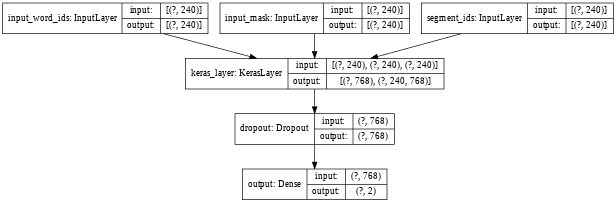

In [ ]:
tf.keras.utils.plot_model(new_model, show_shapes=True, dpi=48)

To check training progress we can use the new and the old testing datasets. Their accuracy should be close. Let's see how it compares.

In [ ]:
loss, accuracy = new_model.evaluate(X_test, dummy_y_test, verbose=False)  # OLD
print("Old testing Accuracy:  {:.4f}".format(accuracy))

loss, accuracy = new_model.evaluate(X_test2, dummy_y_test2, verbose=False)  # NEW
print("New testing Accuracy:  {:.4f}".format(accuracy))

Old testing Accuracy:  0.8291
New testing Accuracy:  0.8367


In [ ]:
epochs = 3
batch_size = 16  # select based on your GPU resources
eval_batch_size = batch_size

train_data_size = len(dummy_y_train2)
steps_per_epoch = int(train_data_size / batch_size)
num_train_steps = steps_per_epoch * epochs
warmup_steps = int(epochs * train_data_size * 0.1 / batch_size)

Now the optimizer we use has learing rate decay in it. Which means learning rate goes down over time by the set parameters. We can lower the initial learning rate for this training session or we could use other optimizer with a fixed learning rate altogether.

In [ ]:
optimizer = nlp.optimization.create_optimizer(
    2e-6, num_train_steps=num_train_steps, num_warmup_steps=warmup_steps)

In [ ]:
new_model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
history2 = new_model.fit(X_train2,  # using new training set
                         dummy_y_train2,  # using new training set
                         epochs=epochs,
                         batch_size=batch_size,
                         validation_data=(X_test, dummy_y_test),  # using old test dataset
                         verbose=1)

Epoch 1/3
4000/4000 [==============================] - ETA: 0s - loss: 0.3844 - accuracy: 0.8290WARNING:tensorflow:Callbacks method `on_test_batch_end` is slow compared to the batch time (batch time: 0.0102s vs `on_test_batch_end` time: 0.1485s). Check your callbacks.


4000/4000 [==============================] - 2188s 547ms/step - loss: 0.3844 - accuracy: 0.8290 - val_loss: 0.3744 - val_accuracy: 0.8320
Epoch 2/3
4000/4000 [==============================] - 2186s 547ms/step - loss: 0.3568 - accuracy: 0.8416 - val_loss: 0.3733 - val_accuracy: 0.8356
Epoch 3/3
4000/4000 [==============================] - 2190s 547ms/step - loss: 0.3406 - accuracy: 0.8500 - val_loss: 0.3752 - val_accuracy: 0.8366


In [ ]:
for i in history2.history:
  for ele in history2.history[i]:
    history.history[i].append(ele)

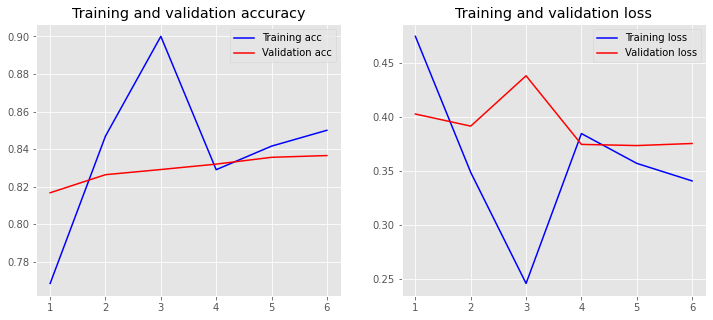

In [ ]:
plot_history(history)

# Test

We need to check in with our label encoder to get our classes.

In [ ]:
encoder_fname = 'twitter_classes.npy'
my_wd = '/content'

encoder = LabelEncoder()
encoder.classes_ = np.load(os.path.join(my_wd, encoder_fname), allow_pickle=True)

This is how our classes are encoded for the model.

In [ ]:
encoder.classes_

array([0, 4])

Input preprocessing.

In [ ]:
tweet = ['SLEEPY JOE BIDEN IS PROPOSING THE BIGGEST TAX HIKE IN OUR COUNTRIES HISTORY! CAN ANYBODY REALLY VOTE FOR THIS?']
inputs = bert_encode(string_list=list(tweet), 
                     tokenizer=tokenizerSaved, 
                     max_seq_length=240)

Prediction.

In [ ]:
prediction = new_model.predict(inputs)
print(prediction)
print('Tweet is', 'positive' if encoder.classes_[np.argmax(prediction)]==4 else 'negative')

[[0.9225999 0.0774001]]
Tweet is negative


In [ ]:
inputs

{'input_mask': <tf.Tensor: shape=(1, 240), dtype=int32, numpy=
 array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]],
       dtype=int32)>,
 'input_type_ids': <tf.Tensor: shape=(1, 240), dtype=int32, numpy=
 array([[0, 1, 1, 1, 1, 1, 